# FPP optimization workflow 

In [345]:
using Revise
using FUSE
using IMAS
using Plots;
FUSE.logging(Logging.Info; actors=Logging.Debug);

## Make new FPP equilibirum from scratch

### Initialize from FPP v1 demount

In [346]:
dd = IMAS.dd()
ini, act = FUSE.case_parameters(:FPP, version=:v2);

### Modify ini

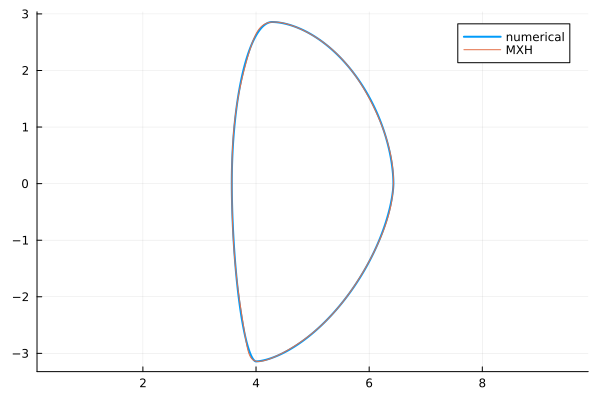

R0: 5.000054394587002
Z0: -0.14285714285714302
ϵ: 0.28570029868693436
κ: 2.1000799630875866
c0: 0.07734669396318156
c: [0.06696482712163067, -0.039414582624228305, -0.00010538832518766042, 0.0021726177197510265, 0.003558686500628801]
s: [0.5384279367036123, 0.06221276800205346, -0.043431421681384384, 0.009875461164136973, 0.03232110608834319]


86400.0

In [347]:
ini.equilibrium.R0 = 5.0
ini.equilibrium.B0 = 6.0
ini.equilibrium.ip = 8.5e6
ini.equilibrium.ϵ = missing # 1/3.5
ini.equilibrium.κ = missing # 2.1
ini.equilibrium.δ = missing # 0.6
ini.equilibrium.ζ = 0.0
ini.equilibrium.pressure_core = 1.5e6
ini.equilibrium.field_null_surface = 0.8
ini.equilibrium.xpoints = :lower

ini.core_profiles.impurity = :Kr
ini.core_profiles.n_shaping = 1.25 #2.5
ini.core_profiles.T_shaping = 1.25 #2.5
ini.core_profiles.T_ratio = 0.825

ini.core_profiles.greenwald_fraction = 1.1
ini.core_profiles.greenwald_fraction_ped = 0.55

ini.core_profiles.ne_ped = missing
ini.core_profiles.helium_fraction = 0.04
ini.core_profiles.zeff = 1.75

ini.ec_launcher[1].power_launched = 0.0e6 #W
ini.ec_launcher[2].power_launched = 35.0e6 #W

mhx_order = 5
R0 = ini.equilibrium.R0
eps = 1/3.5
a = R0*eps
kapu = 2.0
kapl = 2.2
delu = 0.5
dell = 0.7
zetaou = -0.1
zetaol = -0.2
zetaiu = -0.0
zetail = -0.1
upnull = false
lonull = false

r, z, zref = try
    IMAS.boundary_shape(; a, eps, kapu, kapl, delu, dell, zetaou, zetaiu, zetaol, zetail, zoffset=0.0, upnull, lonull)
catch e
    [NaN], [NaN], [NaN]
end

mxh = IMAS.MXH(r, z, mhx_order)
mxh_vect = IMAS.flat_coeffs(mxh)

ini.equilibrium.boundary_from = :MXH_params
ini.equilibrium.MXH_params = mxh_vect

plot(r, z; aspect_ratio=:equal, lw=2, label="numerical")
display(plot!(mxh,label="MXH"))
display(mxh)

ini.build.plasma_gap = 0.125
ini.build.divertors = :lower
ini.build.symmetric = false
ini.build.n_first_wall_conformal_layers = 2

ini.pf_active.n_coils_outside = 6
ini.pf_active.n_coils_inside = 0
ini.pf_active.technology = :Nb3Sn
ini.tf.shape = :princeton_D #_scaled
ini.oh.n_coils = 6

ini.requirements.flattop_duration = 24*3600.0

In [348]:
R0 = ini.equilibrium.R0
ϵ = eps
a = R0*ϵ

RiPlasma = R0 - a

layers = FUSE.OrderedCollections.OrderedDict{String,Float64}()

# HFS layers

layers["plasma"] = 2*a*(1+ini.build.plasma_gap)
layers["hfs first wall"] = 0.02
layers["hfs blanket"] = 0.55*((1/ϵ-1.8)/2.2)^0.5
layers["hfs high temp shield"] = RiPlasma*0.05
layers["hfs gap high temp shield vacuum vessel"] = RiPlasma * 0.02
layers["hfs vacuum vessel"] = RiPlasma * 0.05
layers["hfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["hfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["hfs gap low temp shield TF"] = RiPlasma * 0.02

rbCenterPost = (R0 - 0.5*layers["plasma"] - layers["hfs first wall"] - layers["hfs blanket"]
    - layers["hfs high temp shield"] - layers["hfs gap high temp shield vacuum vessel"]
    - layers["hfs vacuum vessel"] - layers["hfs gap vacuum vessel low temp shield"]
    - layers["hfs low temp shield"] - layers["hfs gap low temp shield TF"]);

layers["hfs TF"] = rbCenterPost * 0.25
layers["OH"] = rbCenterPost * 0.25
layers["gap TF OH"] = RiPlasma * 0.02
layers["gap OH"] = rbCenterPost - layers["hfs TF"] - layers["gap TF OH"] - layers["OH"]

# LFS layers

layers["lfs first wall"] = 0.02
layers["lfs blanket"] = 1.0 - 0.25*((1/ϵ-2.1)/1.9)^0.5
layers["lfs high temp shield"] = RiPlasma * 0.05
layers["lfs gap high temp shield vacuum vessel"] = RiPlasma * 0.4
layers["lfs vacuum vessel"] = RiPlasma * 0.05
layers["lfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["lfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["lfs gap low temp shield TF"] = RiPlasma * 0.02
layers["lfs TF"] = layers["hfs TF"]
layers["gap cryostat"] = RiPlasma * 0.6
layers["cryostat"] = 0.2

for layer in ini.build.layers
    layer.thickness = layers[layer.name]
    if occursin("vacuum vessel", layer.name) || occursin("shield", layer.name) || occursin("blanket", layer.name)
        layer.shape = :rectangle_ellipse
    end
end


### Modify act

In [349]:
act.ActorEquilibrium.model = :TEQUILA
act.ActorEquilibrium.symmetrize = false

act.ActorECsimple.rho_0 = [0.1, 0.7]
act.ActorECsimple.width = [0.05, 0.075]

act.ActorPedestal.update_core_profiles = false
act.ActorPedestal.only_powerlaw = false
act.ActorPedestal.T_ratio_pedestal = 1.0

act.ActorHFSsizing.do_plot = true
act.ActorHFSsizing.verbose = true
act.ActorHFSsizing.j_tolerance = 0.5
act.ActorHFSsizing.stress_tolerance = 0.01
act.ActorHFSsizing.error_on_technology = false
act.ActorHFSsizing.error_on_performance = false
act.ActorFluxSwing.operate_oh_at_j_crit = true

act.ActorLFSsizing.maintenance = :vertical
act.ActorLFSsizing.tor_modularity = 2
act.ActorLFSsizing.pol_modularity = 1
act.ActorLFSsizing.verbose = true

act.ActorPFactive.do_plot = true
act.ActorPFactive.update_equilibrium = false
act.ActorCXbuild.rebuild_wall = false

act.ActorPFdesign.do_plot = true
act.ActorPFdesign.symmetric = false

act.ActorPowerNeeds.model = :thermal_power_fraction
act.ActorPowerNeeds.thermal_power_fraction = 0.2

act.ActorThermalCycle.power_cycle_type = :fixed_cycle_efficiency
act.ActorThermalCycle.fixed_cycle_efficiency = 0.4

act.ActorStabilityLimits.raise_on_breach = false

act.ActorCosting.model = :GASC
act.ActorCosting.production_increase = 10.0
act.ActorCosting.learning_rate = 0.616

act.ActorFixedProfiles.T_shaping = ini.core_profiles.T_shaping
act.ActorFixedProfiles.n_shaping = ini.core_profiles.n_shaping
act.ActorFixedProfiles.T_ratio_pedestal = 1.0
act.ActorFixedProfiles.T_ratio_core = ini.core_profiles.T_ratio
act.ActorFixedProfiles.update_pedestal = true
act.ActorFixedProfiles.n_ITB_height = 0.8
act.ActorFixedProfiles.T_ITB_height = 0.3
act.ActorFixedProfiles.ITB_width = 0.1
act.ActorFixedProfiles.ITB_radius = 0.65

act.ActorCoreTransport.model = :FixedProfiles

act.ActorStationaryPlasma.convergence_error = 5e-3
act.ActorStationaryPlasma.max_iter = 8
act.ActorStationaryPlasma.do_plot = true

act.ActorTEQUILA.debug = false
act.ActorTEQUILA.relax = 0.8
act.ActorTEQUILA.number_of_radial_grid_points = 21
act.ActorTEQUILA.number_of_MXH_harmonics = 6

#act.ActorTEQUILA.number_of_iterations = 50
#act.ActorTEQUILA.tolerance = 0.0001
#act.ActorTEQUILA.ip_from = :pulse_schedule

act.ActorTGLF.user_specified_model = "sat0_es_d3d"

"sat0_es_d3d"

## Run WholeFacility Actor

[ Info: Equilibrium
[ Info:  TEQUILA


[ Info: HCD
[ Info:  ECsimple
[ Info:  ICsimple
[ Info:  LHsimple
[ Info:  NBsimple


[ Info: SteadyStateCurrent
[ Info: CXbuild
┌ Warning: optimize_shape function could not avoid polygon crossings! Perhaps try changing shape?
└ @ FUSE ~/.julia/dev/FUSE/src/physics.jl:290


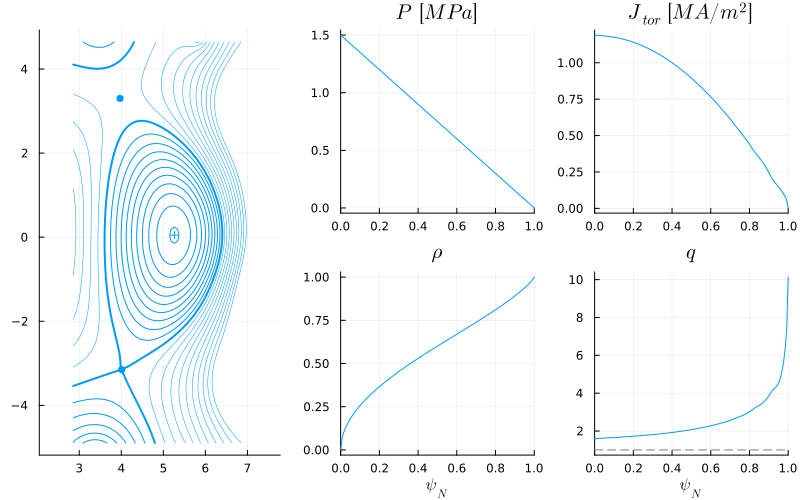

0.033258470872659096

In [350]:
dd = IMAS.dd()
FUSE.init(dd, ini, act; do_plot=false);
mxh_plot = plot(dd.equilibrium, show_x_points=true)
display(mxh_plot)
eq = dd.equilibrium.time_slice[]
dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [351]:
# modify secondary X point

if false
    XP2_R = 4.0
    XP2_Z = 4.0

    dd.pulse_schedule.position_control.x_point[1].r.reference.data .= XP2_R
    dd.pulse_schedule.position_control.x_point[1].z.reference.data .= XP2_Z

    display(dd.pulse_schedule.position_control.x_point)

end

# modify outer strike point

if true
    OSP_R = 4.0
    OSP_Z = -4.00

    pc = dd.pulse_schedule.position_control
    time0 = 100.0

    resize!(pc.strike_point, 1; wipe=false)

    IMAS.set_time_array(pc.strike_point[1].r.reference, :data, time0, OSP_R)
    IMAS.set_time_array(pc.strike_point[1].z.reference, :data, time0, OSP_Z)

    display(dd.pulse_schedule.position_control.strike_point)
end

strike_point
└─ 1
   ├─ r
   │  └─ reference
   │     ├─ data ➡ [4] [mixed]
   │     └─ time ➡ [100] [s]
   └─ z
      └─ reference
         ├─ data ➡ [-4] [mixed]
         └─ time ➡ [100] [s]


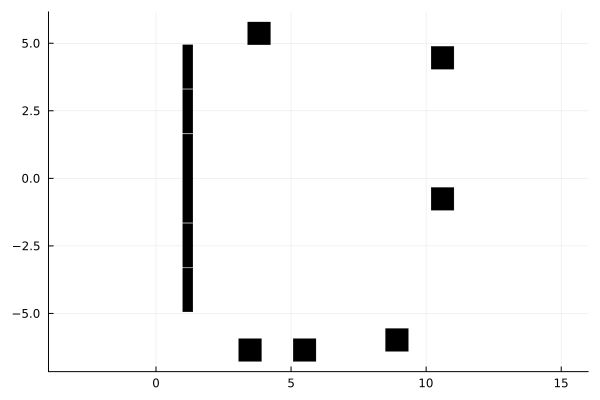

In [352]:
# set PF coil locations

# 5 CS coils (with the midplane coil double-sized)
# 6 PF coils

nCS = 5
nPF = 6

import FUSE: init_pf_active!
import IMAS: BuildLayerType, _plasma_, _gap_, _oh_, _tf_, _shield_, _blanket_, _wall_, _vessel_, _cryostat_, _divertor_, _port_
import IMAS: BuildLayerSide, _lfs_, _lhfs_, _hfs_, _in_, _out_

init_pf_active!(dd.pf_active, dd.build, dd.equilibrium.time_slice[], [nCS,nPF])
coil_w = dd.pf_active.coil[7].element[1].geometry.rectangle.width

vessel = IMAS.get_build_layer(dd.build.layer; fs=_hfs_, type=_vessel_)
port = dd.build.structure[3]
lt_shield = IMAS.get_build_layer(dd.build.layer; name="lfs low temp shield")

# CS coils

zmax = maximum(vessel.outline.z)
zmin = minimum(vessel.outline.z)
cs_height = (zmax-zmin)/6

dd.pf_active.coil[1].element[1].geometry.rectangle.height = cs_height*0.98
dd.pf_active.coil[1].element[1].geometry.rectangle.z = -2.5 * cs_height

dd.pf_active.coil[2].element[1].geometry.rectangle.height = cs_height*0.98
dd.pf_active.coil[2].element[1].geometry.rectangle.z = -1.5 * cs_height

dd.pf_active.coil[3].element[1].geometry.rectangle.height = cs_height*2*0.99
dd.pf_active.coil[3].element[1].geometry.rectangle.z = 0.0

dd.pf_active.coil[4].element[1].geometry.rectangle.height = cs_height*0.98
dd.pf_active.coil[4].element[1].geometry.rectangle.z = 1.5 * cs_height

dd.pf_active.coil[5].element[1].geometry.rectangle.height = cs_height*0.98
dd.pf_active.coil[5].element[1].geometry.rectangle.z = 2.5 * cs_height



# PF coils

toprail_R = [vessel.end_radius+coil_w/2, minimum(port.outline.r)-coil_w/2]
toprail_Z = maximum(lt_shield.outline.z)+coil_w/2*1.25

outrail_R = maximum(port.outline.r[port.outline.z .> 0])+coil_w/2*1.25
outrail_Z = [maximum(vessel.outline.z), minimum(port.outline.z)-coil_w/2*1.25]

botrail_R = [vessel.end_radius+coil_w, maximum(vessel.outline.r)-coil_w*2]
botrail_Z = minimum(lt_shield.outline.z)-coil_w/2*1.25

dd.pf_active.coil[nCS+1].element[1].geometry.rectangle.r = sum(toprail_R)/2
dd.pf_active.coil[nCS+1].element[1].geometry.rectangle.z = toprail_Z

dd.pf_active.coil[nCS+2].element[1].geometry.rectangle.r = outrail_R
dd.pf_active.coil[nCS+2].element[1].geometry.rectangle.z = maximum(outrail_Z)

dd.pf_active.coil[nCS+3].element[1].geometry.rectangle.r = outrail_R
dd.pf_active.coil[nCS+3].element[1].geometry.rectangle.z = sum(outrail_Z)/2

dd.pf_active.coil[nCS+4].element[1].geometry.rectangle.r = outrail_R-2*coil_w
dd.pf_active.coil[nCS+4].element[1].geometry.rectangle.z = minimum(outrail_Z)

dd.pf_active.coil[nCS+5].element[1].geometry.rectangle.r = sum(botrail_R)/2
dd.pf_active.coil[nCS+5].element[1].geometry.rectangle.z = botrail_Z

dd.pf_active.coil[nCS+6].element[1].geometry.rectangle.r = minimum(botrail_R)
dd.pf_active.coil[nCS+6].element[1].geometry.rectangle.z = botrail_Z;

plot(dd.pf_active)

[ Info: WholeFacility
[ Info:  StationaryPlasma


Jtor0_before = 1.21 MA/m²
P0_before = 1631.39 kPa
βn_MHD = 4.58
βn_tot = 2.93
Te_ped = 2.79e+03 eV
rho_ped = 0.9500


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.88 MA m^2
   P0_after = 1631.39 kPa
     βn_MHD = 3.61
     βn_tot = 3.63
     Te_ped = 2.41e+03 eV
    rho_ped = 0.9488


[ Info: Iteration = 1 , convergence error = 0.17938, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.62 MA m^2
   P0_after = 1631.39 kPa
     βn_MHD = 3.85
     βn_tot = 3.68
     Te_ped = 2.63e+03 eV
    rho_ped = 0.9518


[ Info: Iteration = 2 , convergence error = 0.05876, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple


[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.48 MA m^2
   P0_after = 1631.39 kPa
     βn_MHD = 3.62
     βn_tot = 3.69
     Te_ped = 2.67e+03 eV
    rho_ped = 0.9537


[ Info: Iteration = 3 , convergence error = 0.01262, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current


[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.55 MA m^2
   P0_after = 1631.39 kPa
     βn_MHD = 3.66
     βn_tot = 3.70
     Te_ped = 2.78e+03 eV
    rho_ped = 0.9516


[ Info: Iteration = 4 , convergence error = 0.00912, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA


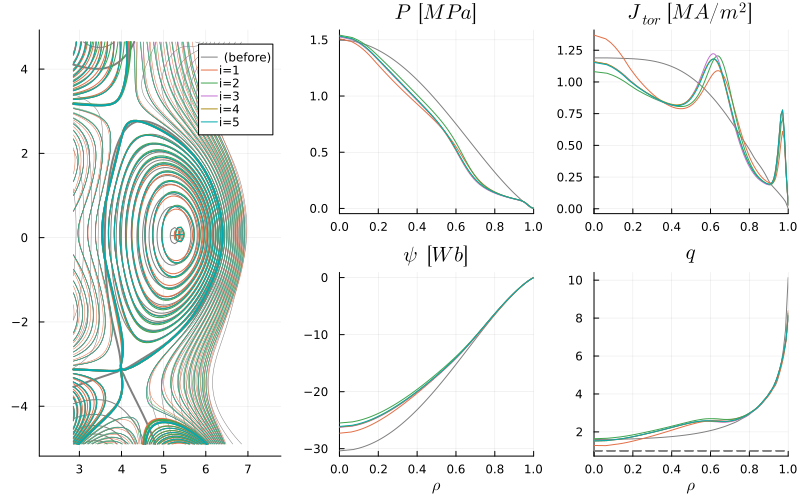

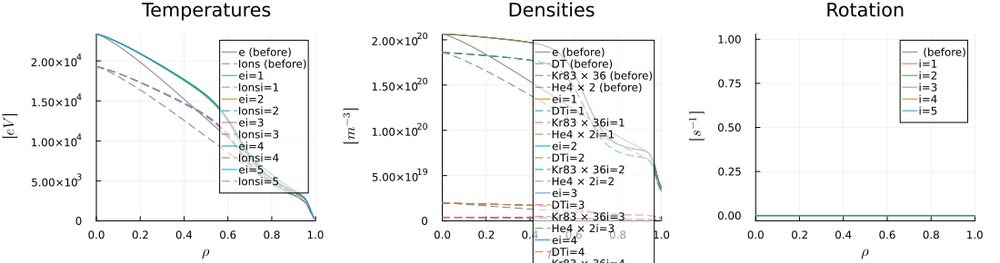

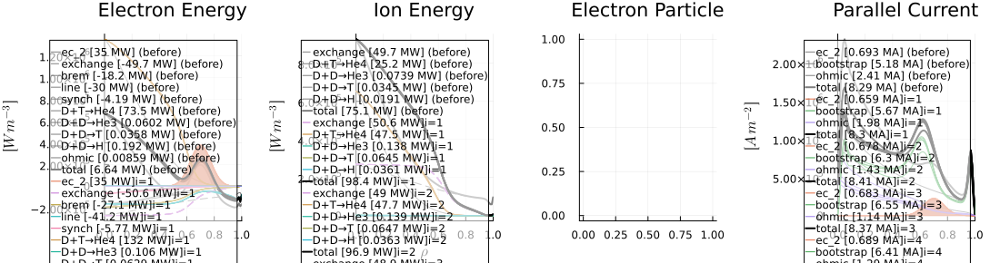


Jtor0_after = 0.55 MA m^2
   P0_after = 1631.38 kPa
     βn_MHD = 3.67
     βn_tot = 3.70
     Te_ped = 2.77e+03 eV
    rho_ped = 0.9520


[ Info: Iteration = 5 , convergence error = 0.00227, threshold = 0.005


[ Info:  StabilityLimits
[ Info:  FluxSwing
[ Info:  Stresses
[ Info:  Neutronics


[ Info:  Blanket


[ Info:   CXbuild
┌ Warning: optimize_shape function could not avoid polygon crossings! Perhaps try changing shape?
└ @ FUSE ~/.julia/dev/FUSE/src/physics.jl:290


[ Info:  Divertors


[ Info:  BalanceOfPlant
[ Info:   HeatTransfer
[ Info:   ThermalCycle


[ Info:   PowerNeeds
[ Info:  Costing
[ Info:   GASCCosting


[ Info:    SheffieldCosting


In [353]:
FUSE.ActorWholeFacility(dd, act, update_build=false);

## Summary

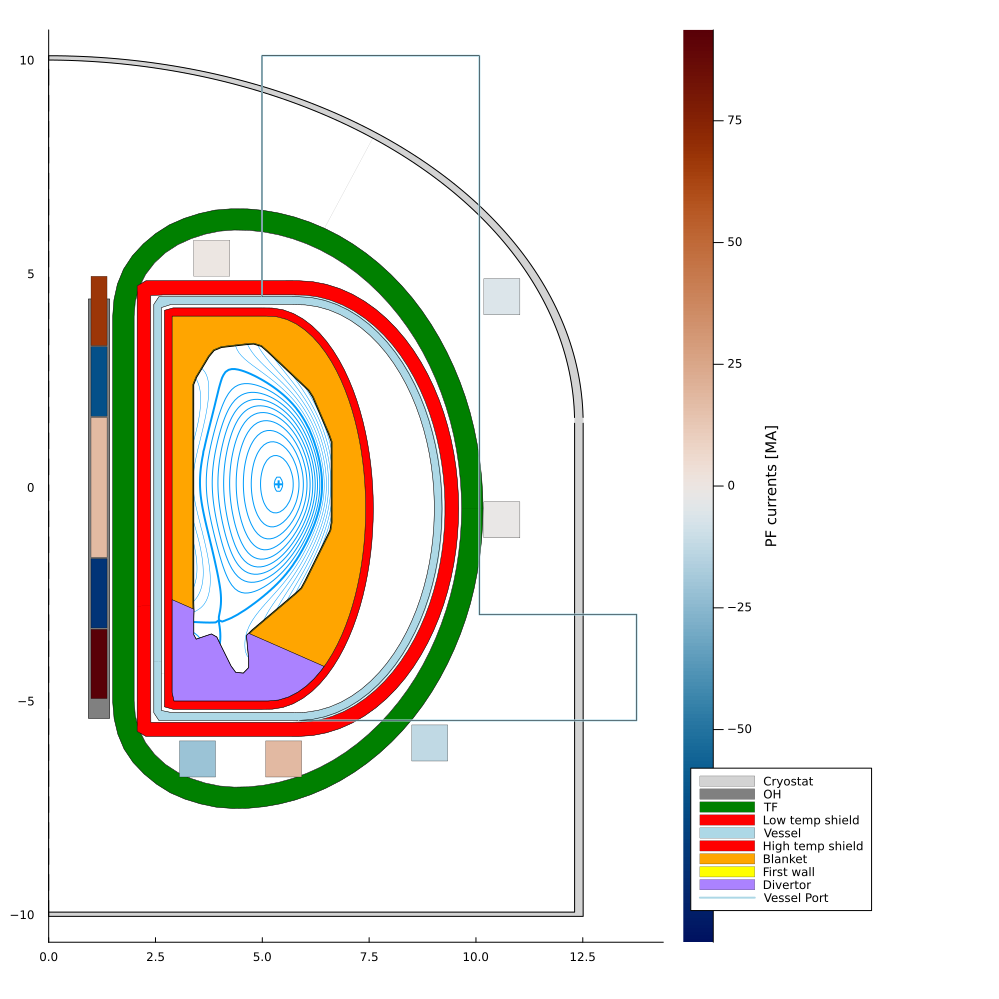

In [354]:
plot(size=(1000,1000))
plot!(dd.equilibrium,cx=true)
plot!(dd.build)
plot!(dd.pf_active)

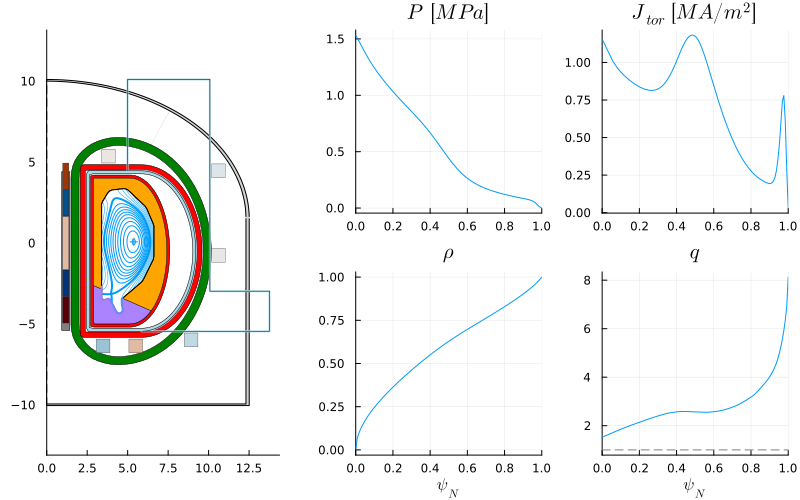

GEOMETRY                         EQUILIBRIUM                      TEMPERATURES                     DENSITIES                        
─────────────────────────────    ─────────────────────────────    ─────────────────────────────    ─────────────────────────────    
R0 → 5 [m]                       B0 → 6 [T]                       Te0 → 23.4 [keV]                 ne0 → 2.06e+20 [m⁻³]             
a → 1.43 [m]                     ip → 8.12 [MA]                   Ti0 → 19.3 [keV]                 ne_ped → 7.15e+19 [m⁻³]          
1/ϵ → 3.5                        q95 → 4.92                       <Te> → 10.6 [keV]                <ne> → 1.34e+20 [m⁻³]            
κ → 2.1                          <Bpol> → 0.691 [T]               <Ti> → 9.06 [keV]                ne0/<ne> → 1.54                  
δ → 0.511                        βpol_MHD → 2.41                  Te0/<Te> → 2.21                  fGW → 1.27                       
ζ → -0.0624                      βtor_MHD → 0.0345                Ti0

24×9 DataFrame
 Row │ group   details     type      ΔR         R_start    R_end      material      area        volume     
     │ String  String      String    Float64    Float64    Float64    String        Float64     Float64    
─────┼─────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            0.928503    0.0        0.928503                  9.11176     26.5788
   2 │ in                  oh        0.499967    0.928503   1.42847   ReBCO           4.90637     36.3299
   3 │ in                            0.0714306   1.42847    1.4999                    0.700977     6.44881
   4 │ hfs                 tf        0.499967    1.4999     1.99987   ReBCO          18.0598     226.932
   5 │ hfs                           0.0714306   1.99987    2.0713                   11.5968     377.879
   6 │ hfs     low temp    shield    0.318152    2.0713     2.38945   Steel          10.1172     337.381
   7 │ hfs                 

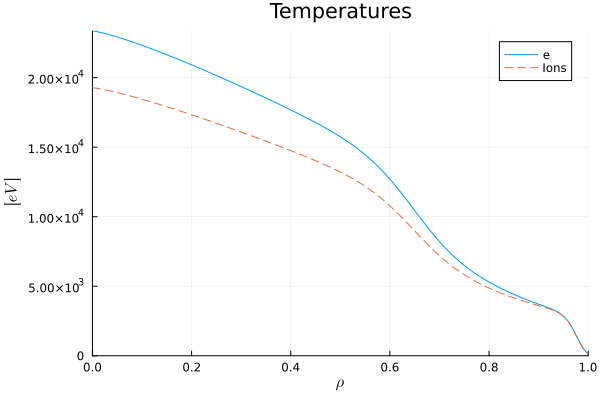

​
​


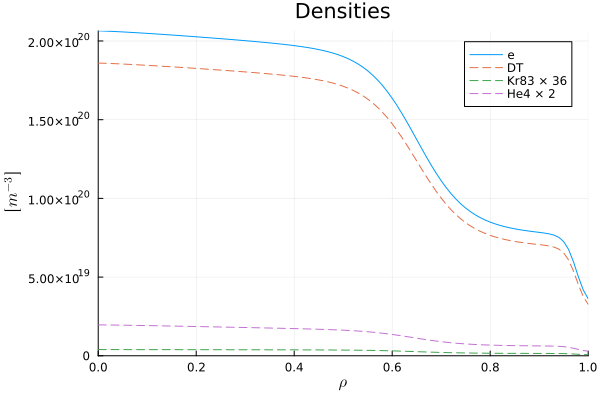

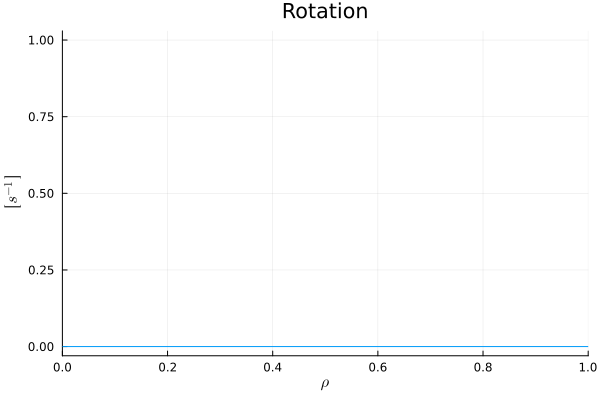

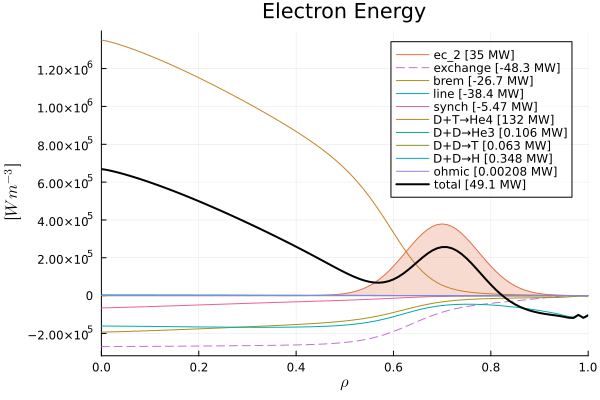

​
​
​


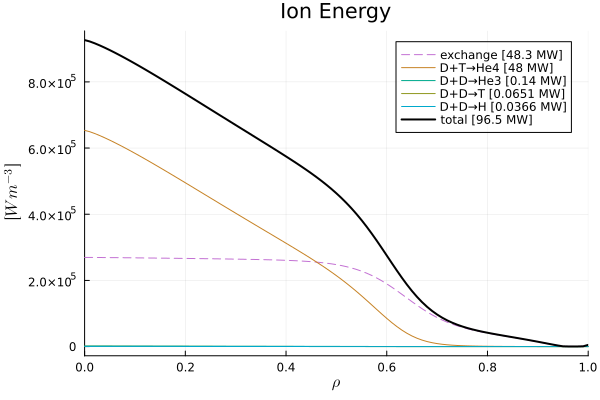

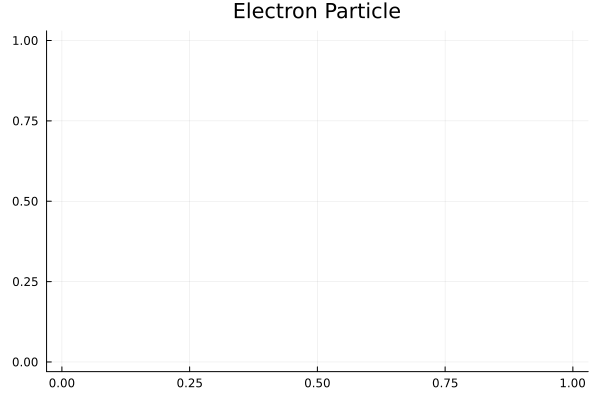

​
​


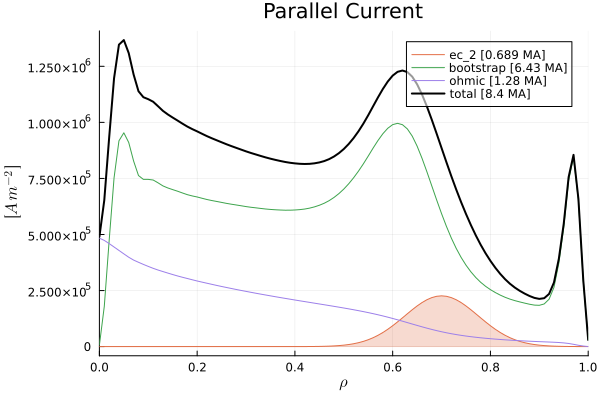

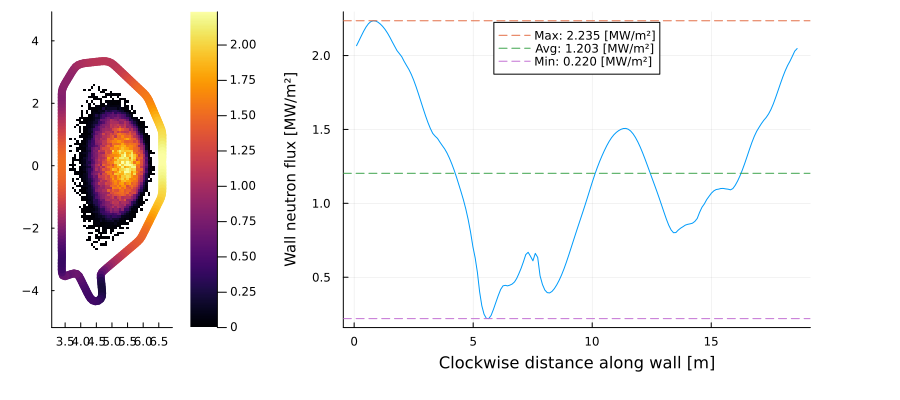

​
​


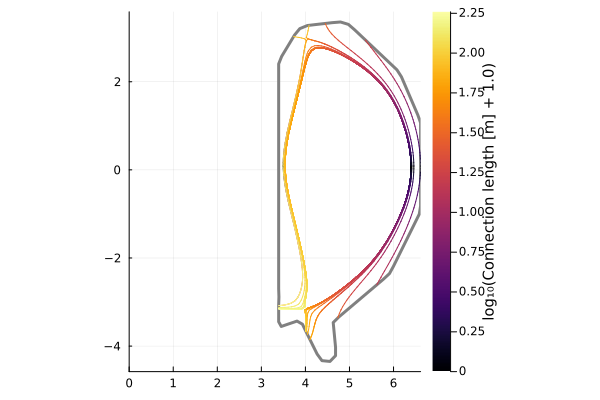

​


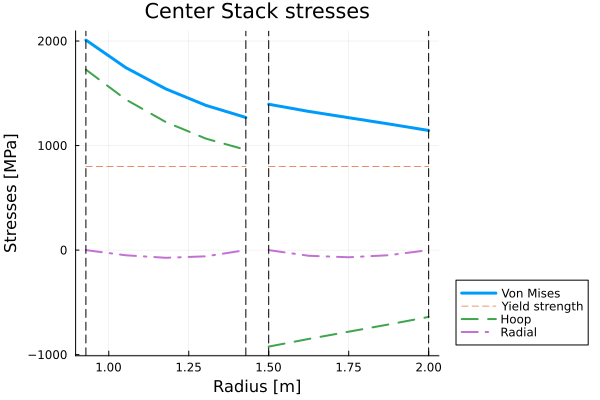

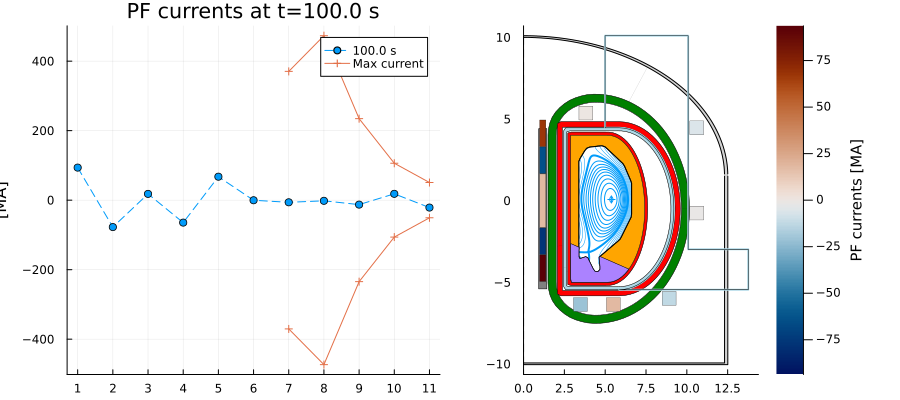

​
​


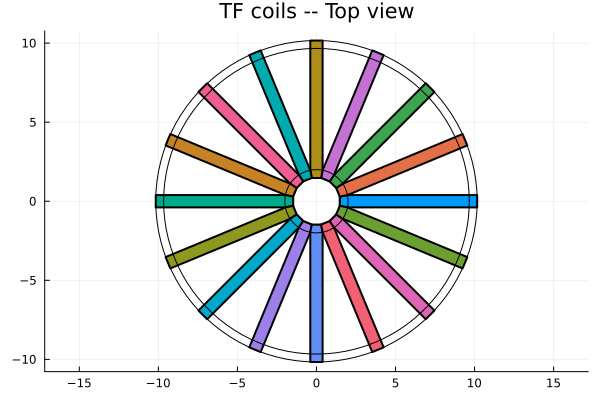

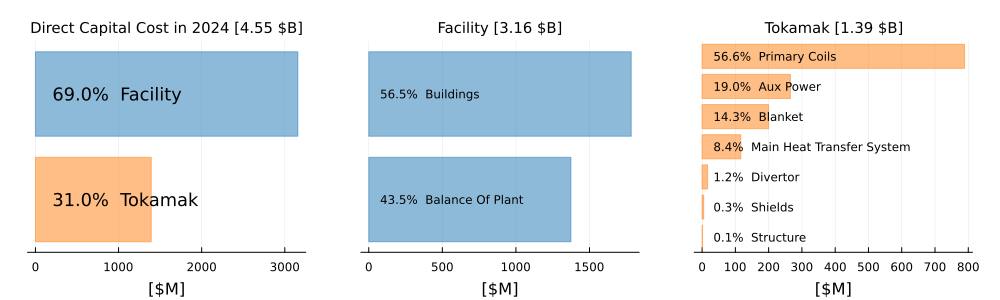

​
​


In [355]:
FUSE.digest(dd)

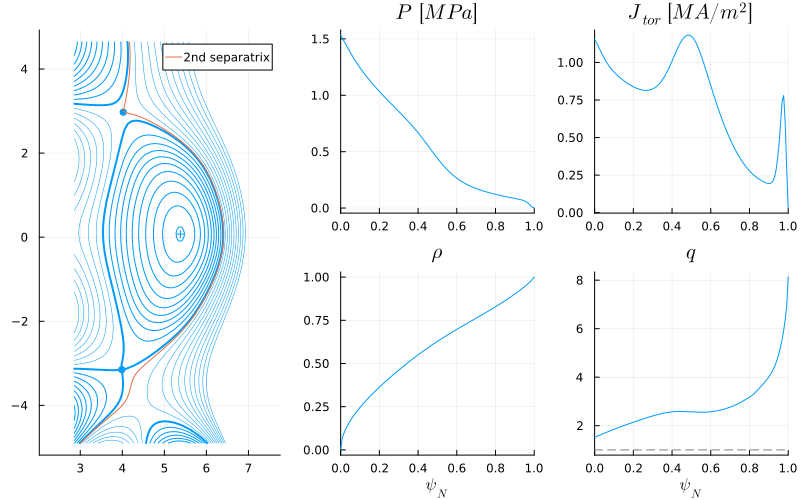

0.014737337852172239

In [356]:
eq = dd.equilibrium.time_slice[]

plot(eq, show_x_points=true)
display(plot!(eq.boundary_secondary_separatrix.outline.r,eq.boundary_secondary_separatrix.outline.z,label="2nd separatrix"))

dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [357]:
if false
    savedir = "FPP_build_TEQUILA_MXH/"
    FUSE.save(savedir,dd,ini,act)
end

In [358]:
act.ActorTGLF

ActorTGLF{Float64}
├─ model{Symbol} ➡ :TGLFNN Implementation of TGLF [:TGLF, :TGLFNN, :TJLF]
├─ sat_rule{Symbol} ➡ :sat1 Saturation rule [:sat0, :sat0quench, :sat1, :sat1geo, :sat2, :sat3]
├─ electromagnetic{Bool} ➡ true Electromagnetic or electrostatic
├─ user_specified_model{String} ➡ "sat0_es_d3d" Use a user specified TGLF-NN model stored in TGLFNN/models
├─ rho_transport{AbstractVector{Float64}} ➡ 0.25:0.1:0.85 rho_tor_norm values to compute tglf fluxes on
├─ warn_nn_train_bounds{Bool} ➡ false Raise warnings if querying cases that are certainly outside of the training range
└─ custom_input_files{InputTJLF}}} ➡ missing Sets up the input file that will be run with the custom input file as a mask


[ Info: FluxCalculator
[ Info:  TGLF


[ Info:  Neoclassical


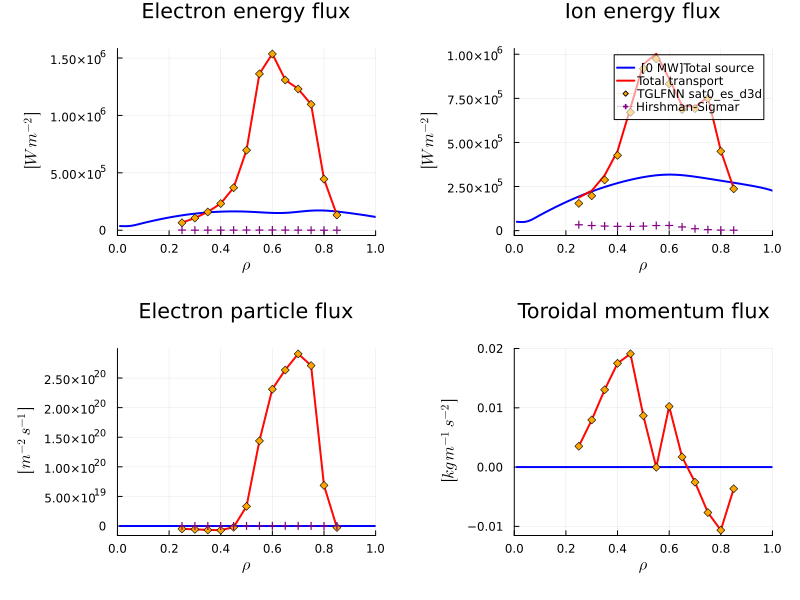

In [359]:
FUSE.ActorFluxCalculator(dd, act; rho_transport=0.25:0.05:0.85);
plot(dd.core_transport)


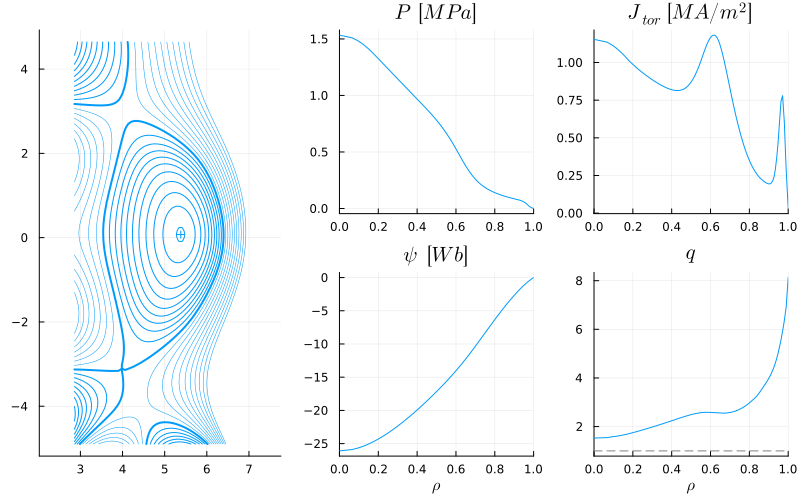

In [360]:
plot(dd.equilibrium, coordinate=:rho_tor_norm)

profiles_1d
├─ current_parallel_inside ➡ 101-element Vector{Float64} [A]
├─ electrons
│  ├─ energy ➡ 101-element Vector{Float64} [W.m^-3]
│  ├─ particles ➡ 101-element Vector{Float64} [m^-3.s^-1] (all 0.0)
│  ├─ particles_inside ➡ 101-element Vector{Float64} [s^-1] (all 0.0)
│  └─ power_inside ➡ 101-element Vector{Float64} [W]
├─ grid
│  ├─ area ➡ 101-element Vector{Float64} [m^2]
│  ├─ psi ➡ Function [Wb]
│  ├─ psi_norm ➡ Function
│  ├─ rho_tor_norm ➡ 101-element Vector{Float64}
│  ├─ surface ➡ 101-element Vector{Float64} [m^2]
│  └─ volume ➡ 101-element Vector{Float64} [m^3]
├─ j_parallel ➡ 101-element Vector{Float64} [A.m^-2]
├─ momentum_tor ➡ 101-element Vector{Float64} [kg.m^-1.s^-2] (all 0.0)
├─ time ➡ 100 [s]
├─ torque_tor_inside ➡ 101-element Vector{Float64} [kg.m^2.s^-2] (all 0.0)
├─ total_ion_energy ➡ 101-element Vector{Float64} [W.m^-3]
└─ total_ion_power_inside ➡ 101-element Vector{Float64} [W]


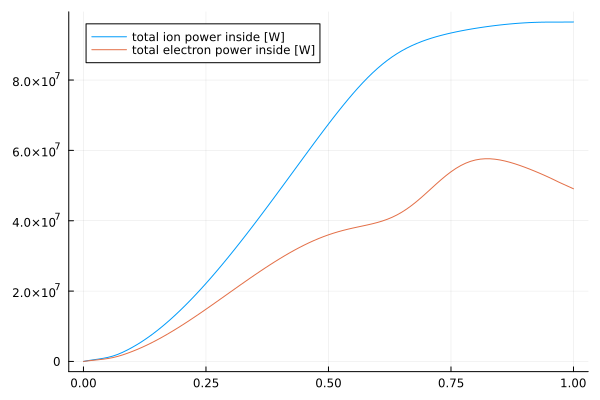

In [361]:
ts = IMAS.total_sources(dd.core_sources, dd.core_profiles.profiles_1d[],)

display(ts)

plot(ts.grid.rho_tor_norm,ts.total_ion_power_inside,label="total ion power inside [W]")
plot!(ts.grid.rho_tor_norm,ts.electrons.power_inside,label="total electron power inside [W]")

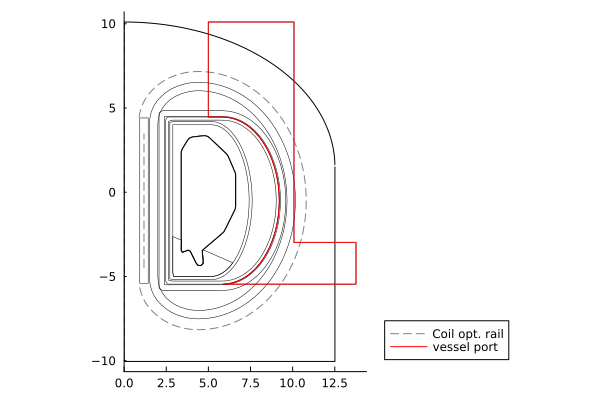

In [362]:
port = dd.build.structure[3]

plot(dd.build, wireframe=true)
plot!(dd.build.pf_active.rail)
plot!(port.outline.r, port.outline.z, color=:red, label="vessel port")
